In [1]:
%matplotlib inline

import os
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib import gridspec

import scipy

import plotly
import plotly.express as px
from plotly.graph_objs import Figure, Layout, Scatter3d
import torch
import sklearn.datasets
import torch.nn as nn
from torchdiffeq import odeint_adjoint as odeint

import ot

FONTSIZE = 14
matplotlib.rc('font', **{'family': 'sans-serif', 'sans-serif': 'Arial', 'weight': 'normal', 'size': FONTSIZE})
matplotlib.rc('text', usetex=True)
matplotlib.rc('mathtext', **{'fontset': 'custom', 'rm': 'sans', 'it': 'sans:italic', 'default': 'it'})

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42


# generate data 


def generate_data(name=''):
    dim = 2
    if name == 'ellipse':
        num = 100
        source_samples , color = sklearn.datasets.make_circles(n_samples=2*num, shuffle=False)
        target_samples , color = sklearn.datasets.make_circles(n_samples=2*num, shuffle=False)
        source_samples = source_samples[:num]
        target_samples = target_samples[:num]
        source_samples[:,0]*=1.5
        target_samples[:,0]*=1.5
        target_samples[:,[0,1]] = target_samples[:,[1,0]]
        target_samples[:,0]*=-1
    elif name == 'cat':
        num = 500
        source_samples = np.load('dataset/cat_500.npy')
        source_samples -= source_samples.mean(axis=0)
        target_samples = np.load('dataset/cat_500.npy')
        target_samples -= target_samples.mean(axis=0)
        target_samples[:,[0,1]] = target_samples[:,[1,0]]
        target_samples[:,0]*=-1
    elif name == 'heart':
        num = 500
        source_samples = np.load('dataset/heart_500.npy')
        source_samples -= source_samples.mean(axis=0)
        target_samples = np.load('dataset/heart_500.npy')
        target_samples -= target_samples.mean(axis=0)
        source_samples[:,1]*=2
        target_samples[:,1]*=2
        target_samples[:,[0,1]] = target_samples[:,[1,0]]
        target_samples[:,0]*=-1
    elif name == 'cat_heart':
        num = 500
        source_samples = np.load('dataset/cat_500.npy')
        source_samples -= source_samples.mean(axis=0)
        target_samples = np.load('dataset/heart_500.npy')
        target_samples -= target_samples.mean(axis=0)
        target_samples[:,1]*=2
    elif name == 'cat_rotated_heart':
        num = 500
        source_samples = np.load('dataset/cat_500.npy')
        source_samples -= source_samples.mean(axis=0)
        target_samples = np.load('dataset/heart_500.npy')
        target_samples -= target_samples.mean(axis=0)
        target_samples[:,1]*=2
        target_samples[:,[0,1]] = target_samples[:,[1,0]]
        target_samples[:,0]*=-1
    elif name == 'square':
        num = 200
        side1 = np.concatenate(([np.linspace(-1,1,num=50)],[np.ones(50)]), axis=0).T
        side2 = np.concatenate(([np.linspace(-1,1,num=50)],[-np.ones(50)]), axis=0).T
        side3 = np.concatenate(([np.ones(50)],[np.linspace(-1+0.02,1-0.02,num=50)]), axis=0).T
        side4 = np.concatenate(([-np.ones(50)],[np.linspace(-1+0.02,1-0.02,num=50)]), axis=0).T
        source_samples = np.concatenate((side1,side2,side3,side4),axis=0)
        target_samples = source_samples.copy()
    elif name == 'infinity':
        num = 100
        t = np.linspace(0, 2 * np.pi, 100)
        a = 1  # scaling factor
        x = a * np.cos(t) / (1 + np.sin(t)**2)
        y = a * np.cos(t) * np.sin(t) / (1 + np.sin(t)**2)
        noise_level = 0
        x_noisy = x + noise_level * np.random.normal(size=x.shape)
        y_noisy = y + noise_level * np.random.normal(size=y.shape)
        source_samples = np.concatenate(([x_noisy],[y_noisy]),axis=0).T
        source_samples -= source_samples.mean(axis=0)
        target_samples = source_samples.copy()
    elif name == 'moon':
        num = 200
        source_samples, color = sklearn.datasets.make_moons(n_samples=num, noise=0.05, random_state=170)
        source_samples -= source_samples.mean(axis=0)
        target_samples = source_samples.copy()
    elif name == 'two_circle':
        num = 200
        source_samples , color = sklearn.datasets.make_circles(n_samples=num, shuffle=False)
        source_samples -= source_samples.mean(axis=0)
        target_samples = source_samples.copy()

    
    source = source_samples.copy()
    target = target_samples.copy()
    source_samples = source_samples.astype(np.float32)
    target_samples = target_samples.astype(np.float32)
    source_samples = torch.from_numpy(source_samples)
    target_samples = torch.from_numpy(target_samples)
    return num, dim, source, target, source_samples, target_samples

frame_num = 5
plot_times = torch.linspace(0., 1., frame_num)

Flow matching

In [2]:
# training setus
bandwidth = 0.03

class VelocityFieldNN(nn.Module):
    def __init__(self):
        super(VelocityFieldNN, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(3, 50),
            nn.Tanh(),
            nn.Linear(50, 50),
            nn.Tanh(),
            nn.Linear(50, 2)
        )

    def forward(self, t, x):
        tx = torch.cat((x, t.expand(x.shape[0], 1)), dim=1)
        return self.net(tx)

def kinetic_energy_loss(velocities):
    return torch.mean(torch.sum(velocities ** 2, dim=-1))

def GW_kinetic_energy_loss(velocities,rho):
    q = torch.mean(torch.sum(velocities * (velocities@rho.T@rho/num),dim=1))
    cov = rho.T@velocities/num
    return 2*q+2*torch.sum(cov*cov.T)

def transport_loss(transported_samples, target_samples):
    return torch.mean((transported_samples - target_samples) ** 2)

def transport_loss_MMD(transported_samples, target_samples):
    return MMD(bandwidth, transported_samples, transported_samples) + MMD(bandwidth, target_samples, target_samples) - 2*MMD(bandwidth, transported_samples, target_samples)

def MMD(sigma,X1,X2):
    square = torch.cdist(X1,X2, p=2)**2
    val=torch.exp(-square/sigma)  + torch.exp(-square/(sigma*0.25))  + torch.exp(-square/(sigma*0.05))  + torch.exp(-square/(sigma*4))  + torch.exp(-square/(sigma*20))  + torch.exp(-square/(sigma*0.01)) + torch.exp(-square/(sigma*0.001))+torch.exp(-square/(sigma*0.0001))+ torch.exp(-square/(sigma*100))+ torch.exp(-square/(sigma*1000))
    return torch.mean(val)

def sigma(rho,num):
    return np.matmul(rho.T,rho)/num

def L_transform(rho,grid,sample_v,v,num):
    bsigma = sigma(rho,num)
    return 2*( v@bsigma.T + grid@(sample_v.T@rho/num) )

In [3]:
def compute_gw(target,final_trajectory):
    igw = []
    p = ot.unif(num)
    q = ot.unif(num)

    C1 = target@target.T
    i=0
    for rho in final_trajectory:
        C2 = rho@rho.T
        gw0, log0 = ot.gromov.gromov_wasserstein(
            C1, C2, p, q, 'square_loss', verbose=False, log=True)
        igw = np.append(igw,log0['gw_dist'])
        i+=1
    return igw

In [4]:
def plot_weighted_scatter(ax, X, weights=None, color_ind=0, markersize=15.0):
    if weights is None:
        weights = np.ones(len(X)) / len(X)
    rgba_colors = np.zeros((len(X),4))
    rgba_colors[:,color_ind] = 1.0
    rgba_colors[:,3] = np.clip(weights / np.mean(weights), a_min=0.0, a_max=1.0)
    ax.scatter(X[:,0], X[:,1], color=rgba_colors, marker='.', s=markersize)
    


def full_plot_W(ax,rho, v, sample_v):
    ax.contourf(X,Y,(np.sum(v*v,axis=-1)).reshape(grid_num+1,grid_num+1))
    plot_weighted_scatter(ax,rho,1.0, color_ind=0)
    ax.quiver(grid_data[:,0],grid_data[:,1], v[:,0],v[:,1], scale = 50, color = '1')


def full_plot_GW(ax,rho, v, sample_v):
    w = L_transform(rho,grid_data,sample_v,v,num)
    ax.contourf(X,Y,(np.sum(v*w,axis=-1)).reshape(grid_num+1,grid_num+1))
    plot_weighted_scatter(ax,rho,1.0, color_ind=0)
    ax.quiver(grid_data[:,0],grid_data[:,1], v[:,0],v[:,1], scale = 50, color = '1')


def interpolation_plots_full( axes, seq_points, seq_velocity, seq_gw, target, name='',flow_method='', alpha_target=0.5, markersize=5.0, show_time=True, show_target=True):    
    for i, (t, ax, rho, v, sample_v) in enumerate(zip(plot_times, axes, seq_points, global_velocities, seq_velocity)):
        if flow_method == 'W':
            full_plot_W(ax,rho, v, sample_v)
        elif flow_method == 'GW':
            full_plot_GW(ax,rho, v, sample_v)

        if show_time:
            ax.set_title('t={:.2f}'.format(t), y=1.08, fontsize=20)

        ax.axis('off')
        ax.set_xlim((-2, 2))
        ax.set_ylim((-2, 2))
        ax.set_aspect('equal', adjustable='box')
        
        ax.text(0.5,-0.08, f'IGW = {seq_gw[i]:.4f}', size=12, ha="center", transform=ax.transAxes)
        if i == 0:
            ax.text(-2.5, -0.08 * len(name), name, size=20, ha="center", rotation=90)

    # target
    ax = axes[-1]
    # ax.axis('off')
    if show_target:
        plot_weighted_scatter(ax, target, 1.0, color_ind=2, markersize=markersize)
        
        if show_time:
            ax.set_title('target', y=1.08, fontsize=20)
        ax.set_xlim((-2, 2))
        ax.set_ylim((-2, 2))
        ax.set_aspect('equal', adjustable='box')


def load_and_plot_full(axes, num, dim, source, target, source_samples, target_samples, v_model, name='',flow_method='', show_target=True, show_time=True):
    final_trajectory = odeint(v_model, source_samples, plot_times, method='dopri5').detach().numpy()
    sample_velocity = [v_model(plot_times[i], source_samples).detach().numpy() for i in range(len(plot_times))]
    interpolation_plots_full(axes, seq_points = final_trajectory, seq_velocity = sample_velocity, seq_gw = compute_gw(target,final_trajectory), target=target , name=name,flow_method = flow_method, alpha_target=0.2, show_target=show_target, show_time=show_time)



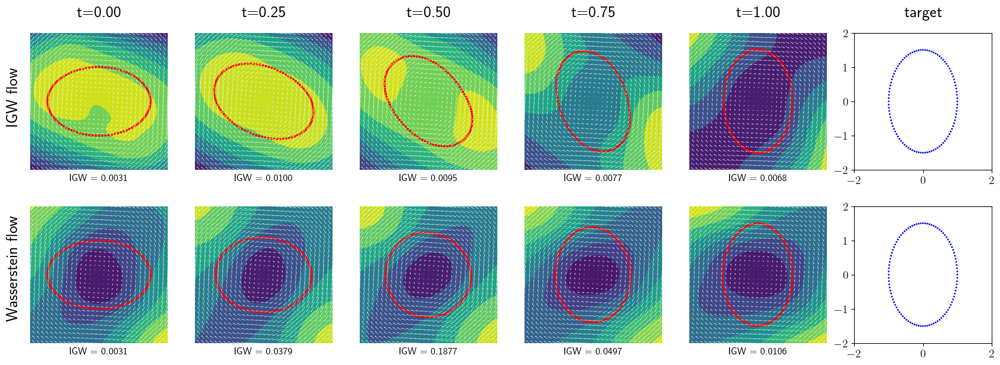

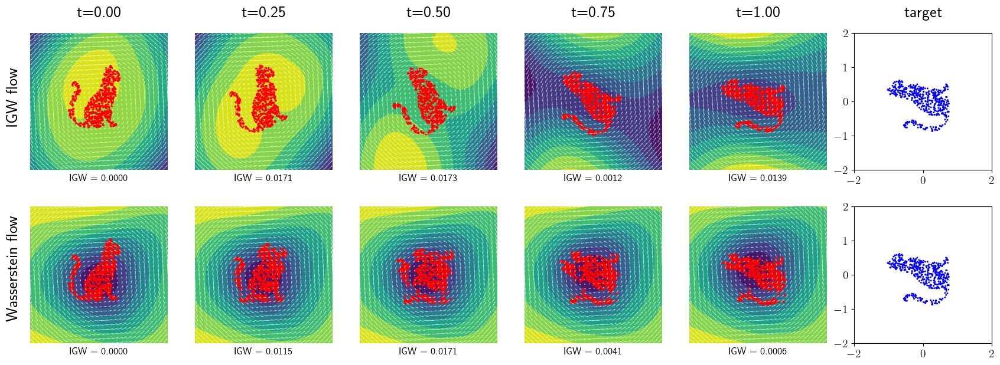

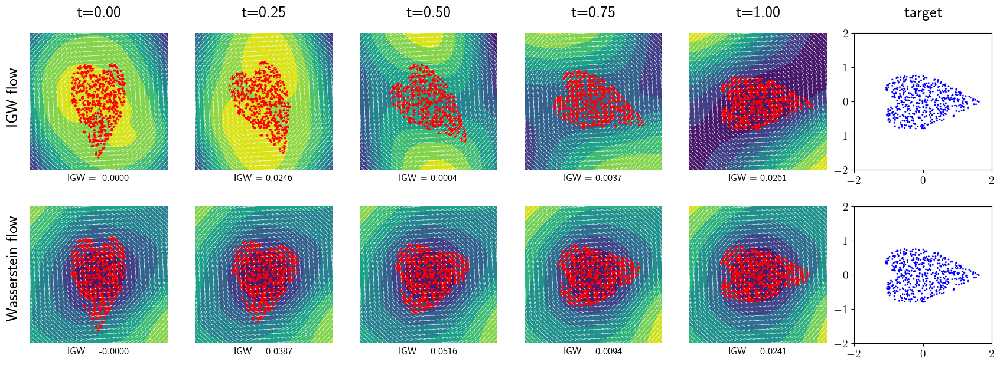

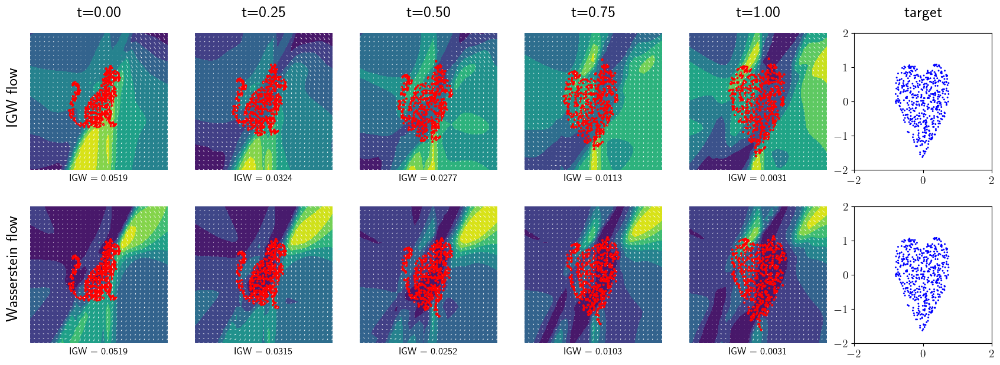

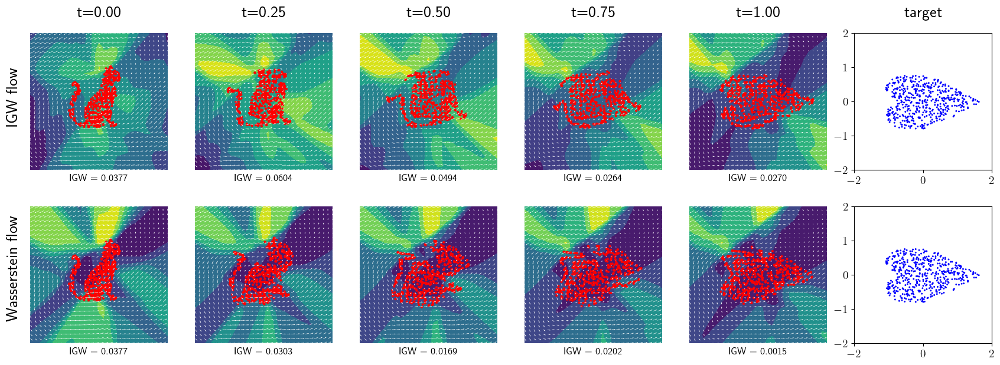

In [5]:
frame_num = 5
plot_times = torch.linspace(0., 1., frame_num)

grid_num = 30
x = np.linspace(-2, 2, grid_num+1)
y = np.linspace(-2, 2, grid_num+1)
X,Y = np.meshgrid(x, y)
grid_data = (np.concatenate(([X.flatten()],[Y.flatten()]), axis=0).T).astype(np.float32)


ncols = 6

for name in ['ellipse', 'cat', 'heart', 'cat_heart', 'cat_rotated_heart']:
    fig, axes = plt.subplots(nrows=2, ncols=ncols, figsize=(3.5 * ncols, 7))
    num, dim, source, target, source_samples, target_samples = generate_data(name)
    v_model = VelocityFieldNN()
    v_model.load_state_dict(torch.load('trained_nn/GW_'+name+'_vtx.pt'))
    v_model.eval()
    global_velocities = [v_model(plot_times[i], torch.from_numpy(grid_data)).detach().numpy() for i in range(len(plot_times))]
    load_and_plot_full(axes[0], num=num, dim=dim, source=source, target=target, source_samples=source_samples, target_samples=target_samples, v_model = v_model, name='IGW flow', flow_method='GW',
                  show_target=True, show_time=True)
    
    v_model = VelocityFieldNN()
    v_model.load_state_dict(torch.load('trained_nn/W_'+name+'_vtx.pt'))
    v_model.eval()
    load_and_plot_full(axes[1], num=num, dim=dim, source=source, target=target, source_samples=source_samples, target_samples=target_samples, v_model = v_model, name='Wasserstein flow',flow_method='W',
                  show_target=True, show_time=False)
    plt.savefig('results/flow_matching/'+name+'.pdf', dpi=160, bbox_inches = 'tight')
    plt.show()
    plt.close()


Gradient flow

In [6]:
# Functionals and their gradients for gradient flow
# epsilon is molifying parameter
epsilon = 0.2

def interaction(x,y):
    kernel_matrix = scipy.spatial.distance.cdist(x,y)
    np.fill_diagonal(kernel_matrix,1)
    kernel_matrix = 1/(epsilon + kernel_matrix)
    np.fill_diagonal(kernel_matrix,0)

    return np.mean(kernel_matrix)/2



def grad_interaction(rho):
    dist_matrix = scipy.spatial.distance.cdist(rho, rho,'sqeuclidean')
    np.fill_diagonal(dist_matrix,1)
    coefficient = 1/ (((epsilon + dist_matrix)**1.5) * dist_matrix)
    np.fill_diagonal(coefficient,0)
    
    return (-np.sum(coefficient,axis=-1).reshape(-1,1)*rho + coefficient @ rho) /(num-1)


def interaction_2d(x,y):
    kernel_matrix = scipy.spatial.distance.cdist(x,y,'sqeuclidean')
    np.fill_diagonal(kernel_matrix,1)
    kernel_matrix = -np.log((epsilon + kernel_matrix))/2
    np.fill_diagonal(kernel_matrix,0)

    return np.mean(kernel_matrix)



def grad_interaction_2d(rho):
    dist_matrix = scipy.spatial.distance.cdist(rho, rho,'sqeuclidean')
    np.fill_diagonal(dist_matrix,1)
    coefficient = 1/ (epsilon + dist_matrix)
    np.fill_diagonal(coefficient,0)
    
    return (-np.sum(coefficient,axis=-1).reshape(-1,1)*rho + coefficient @ rho) /(num-1)



def entropy(rho):
    dist_matrix = scipy.spatial.distance.cdist(rho, rho,'sqeuclidean')
    np.fill_diagonal(dist_matrix,np.max(dist_matrix,axis=1))
    
    return -np.sum(np.log(epsilon+np.min(dist_matrix,axis=1))/2)

def grad_entropy(rho):
    dist_matrix = scipy.spatial.distance.cdist(rho, rho,'sqeuclidean')
    np.fill_diagonal(dist_matrix,np.max(dist_matrix,axis=1))
    ind = np.argmin(dist_matrix,axis=1)
    
    return -(rho-rho[ind])/(epsilon + np.min(dist_matrix,axis=1)).reshape(-1,1)


    
    

def sigma(rho,num):
    return np.matmul(rho.T,rho)/num


def v(sigma,grad,rho):
    grad = -0.5 * grad
    v_1 = np.matmul(np.linalg.inv(sigma),grad.T)
    mat_1 = np.linalg.inv(np.kron(np.eye(dim),np.matmul(sigma,sigma))+np.kron(sigma,sigma))
    mat_2 = (np.matmul(grad.T,rho).T).reshape(-1,1)/num
    mat_3 = (((mat_1@mat_2).T).reshape(dim,dim)).T
    return (v_1 - np.matmul(mat_3,rho.T)).T

def v_global(sigma,grad,rho):
    grad = -0.5 * grad
    v_1 = np.matmul(np.linalg.inv(sigma),grad.T)
    mat_1 = np.linalg.inv(np.kron(np.eye(dim),np.matmul(sigma,sigma))+np.kron(sigma,sigma))
    mat_2 = (np.matmul(grad.T,rho).T).reshape(-1,1)/num
    mat_3 = (((mat_1@mat_2).T).reshape(dim,dim)).T
    return ( - np.matmul(mat_3,rho.T)).T


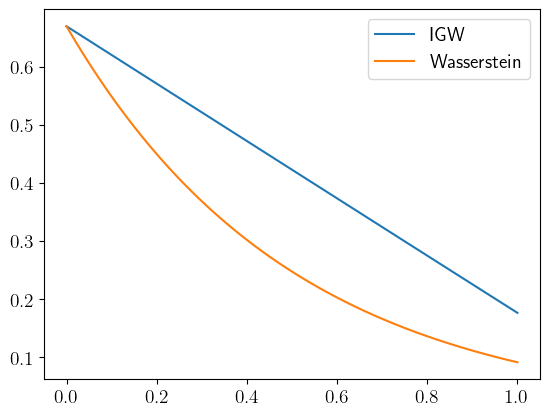

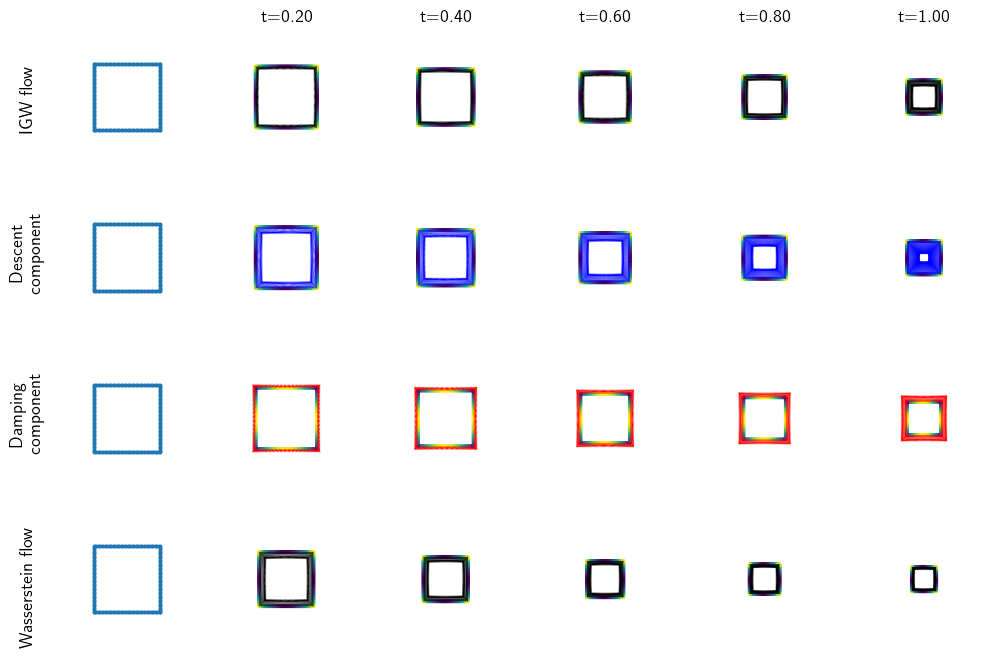

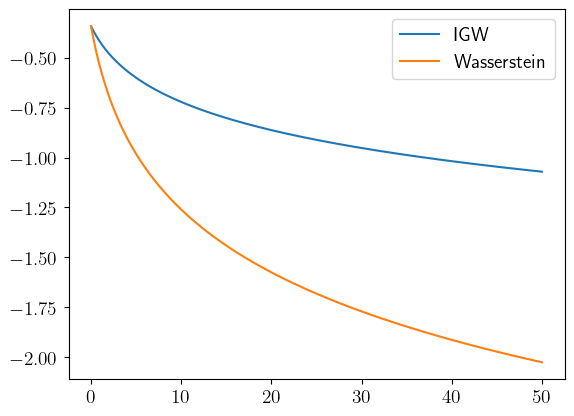

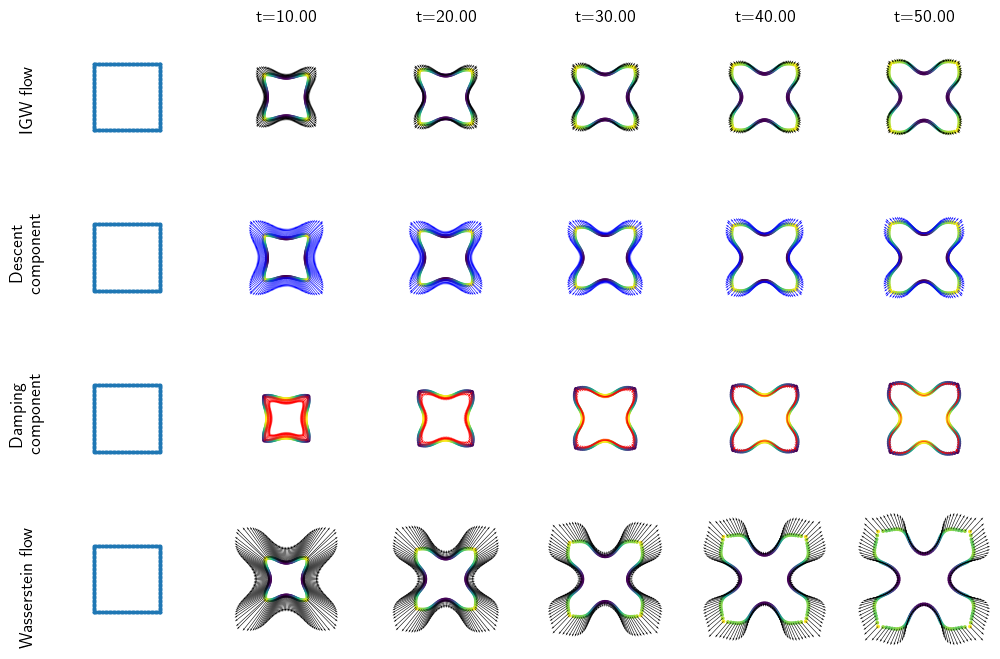

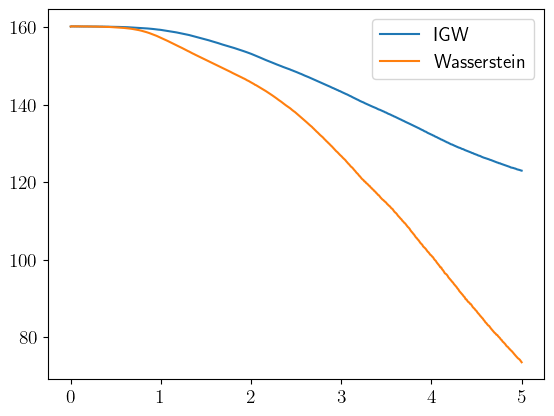

...

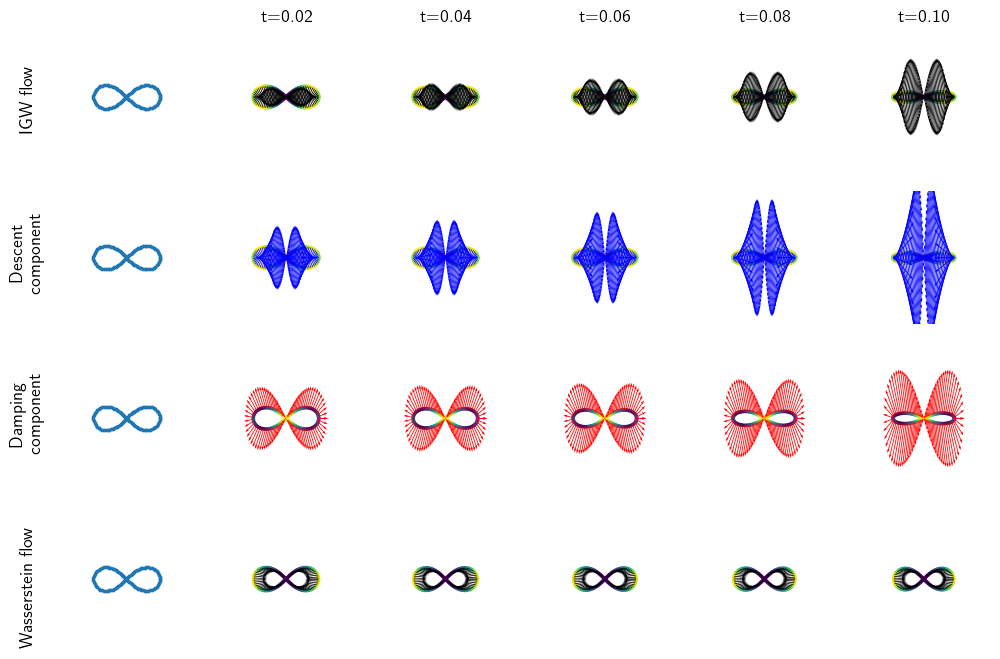

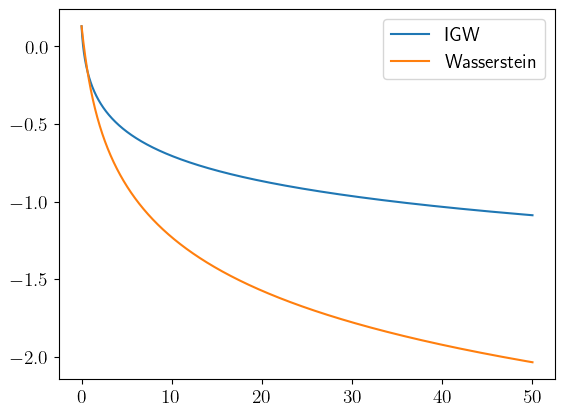

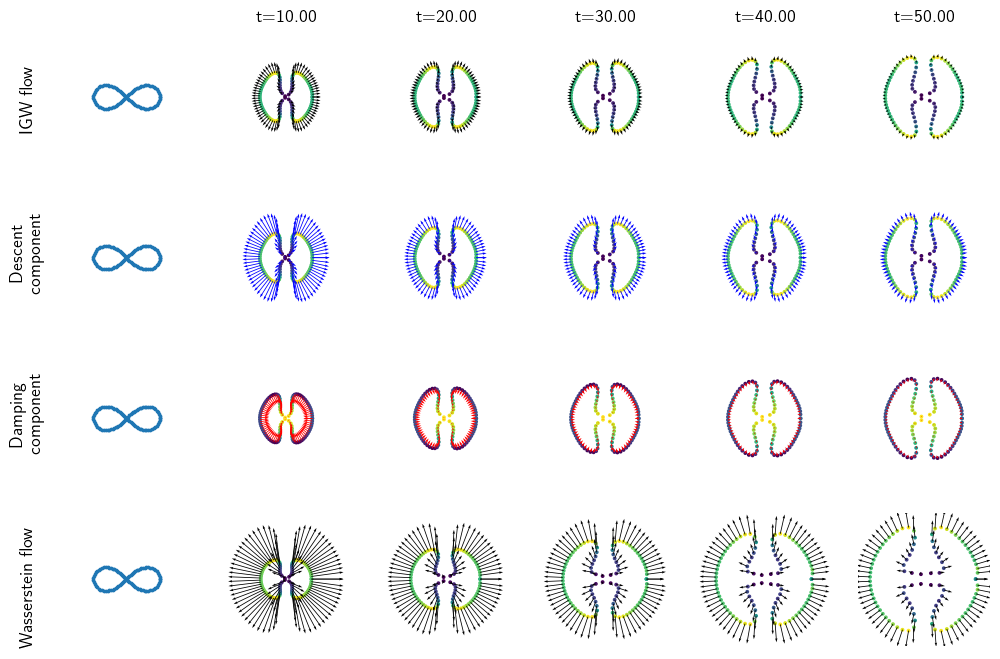

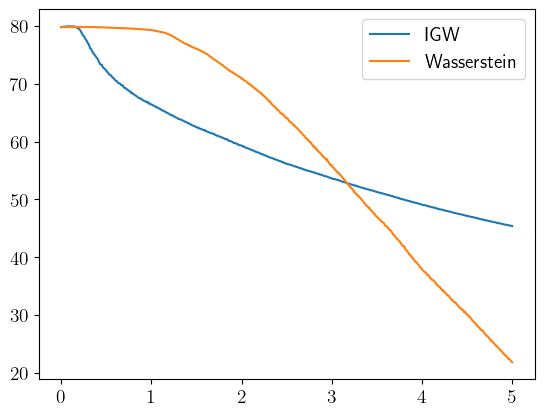

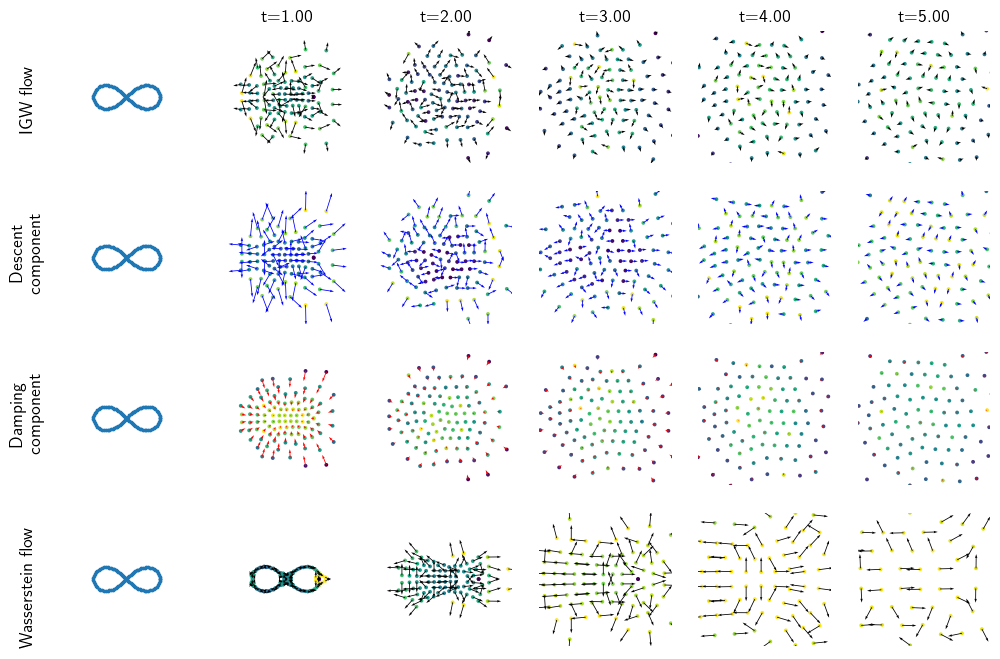

In [7]:
plot_parameters = {
    'ellipsepotential':(1,2,2,15),
    'squarepotential':(1,2,2,15),
    'moonpotential':(0.1,2,2,10),
    'two_circlepotential':(0.1,2,2,10),
    'infinitypotential':(0.1,2,2,10),

    'squareinteraction':(50,5,10,0.7),
    'ellipseinteraction':(50,5,10,0.7),
    'mooninteraction':(50,5,10,0.7),
    'two_circleinteraction':(50,5,10,0.7),
    'infinityinteraction':(50,5,10,0.7),
    
    'squareentropy':(5,2,2,10),
    'ellipseentropy':(5,2,2,10),
    'moonentropy':(5,2,2,10),
    'two_circleentropy':(5,2,2,10),
    'infinityentropy':(5,2,2,10)
    
}

ncols = 6

for data_name in ['square','ellipse',  'moon', 'two_circle', 'infinity']:
    num, dim, source, target, source_samples, target_samples = generate_data(data_name)
    for name in ['potential' , 'interaction', 'entropy']:
        T, plot_scale, W_plot_scale, quiver_scale = plot_parameters[data_name+name]
        rho_GW = source.copy()
        rho_W = source.copy()
        data_GW = [source.copy()]
        data_W = [source.copy()]
        F_GW=[]
        F_W=[]
        tau = 0.01

        # GW part
        for i in range(int(T/tau)):
            if name == 'potential':
                grad = rho_GW
                F_GW = np.append(F_GW,np.mean(rho_GW**2))
            elif name == 'interaction':
                grad = grad_interaction_2d(rho_GW)
                F_GW = np.append(F_GW,interaction_2d(rho_GW,rho_GW))
            elif name == 'entropy':
                grad = grad_entropy(rho_GW)
                F_GW = np.append(F_GW,entropy(rho_GW))
            v_field = v(sigma(rho_GW,num),grad, rho_GW)
            cov_descent = (-0.5* np.matmul(np.linalg.inv(sigma(rho_GW,num)),grad.T).T)
    
            rho_GW += v_field*tau
            if (i+1) % (int(T/tau)/5) == 0:
                data_GW.append(rho_GW.copy())
          
        # W part
        for i in range(int(T/tau)):
            if name == 'potential':
                grad = rho_W
                F_W = np.append(F_W,np.mean(rho_W**2))
            elif name == 'interaction':
                grad = grad_interaction_2d(rho_W)
                F_W = np.append(F_W,interaction_2d(rho_W,rho_W))
            elif name == 'entropy':
                grad = grad_entropy(rho_W)
                F_W = np.append(F_W,entropy(rho_W))
            rho_W -= grad*tau
            if (i+1) % (int(T/tau)/5) == 0:
                data_W.append(rho_W.copy())

        # decay
        plt.plot(np.linspace(0, T, num=int(T/tau)),F_GW,label='IGW')
        plt.plot(np.linspace(0, T, num=int(T/tau)),F_W,label='Wasserstein')
        plt.legend()
        plt.savefig('results/gradient_flow/decay_'+data_name+'_'+name+'.pdf', dpi=160, bbox_inches = 'tight')
        plt.show()
        plt.close()
        
        # plot trajectories
        fig, axes = plt.subplots(nrows=4, ncols=ncols, figsize=(2 * ncols, 8))
        markersize = 3.0
        
        for i,(rho,ax) in enumerate(zip(data_GW,axes[0])):
            if name == 'potential':
                grad = rho
            elif name == 'interaction':
                grad = grad_interaction_2d(rho)
            elif name == 'entropy':
                grad = grad_entropy(rho)
            v_field = v(sigma(rho,num),grad, rho)
            
            if i==0:
                ax.scatter(rho[:,0], rho[:,1],s=markersize)
                ax.set_xlim((-2, 2))
                ax.set_ylim((-2, 2))
                ax.text(-3,-1, 'IGW flow', size=13, ha="center", rotation=90)
                ax.set_aspect('equal', adjustable='box')
            elif i>0:
                ax.scatter(rho[:,0], rho[:,1],c=-np.sum(v_field*grad,axis=-1),s=markersize)
                ax.quiver(rho[:,0],rho[:,1], v_field[:,0],v_field[:,1],scale=quiver_scale)
                ax.set_title('t={:.2f}'.format((i)*T/5), fontsize=13)
                ax.set_xlim((-plot_scale, plot_scale))
                ax.set_ylim((-plot_scale, plot_scale))
                ax.set_aspect('equal', adjustable='box')
            ax.axis('off')
        
        for i,(rho,ax) in enumerate(zip(data_GW,axes[1])):
            if name == 'potential':
                grad = rho
            elif name == 'interaction':
                grad = grad_interaction_2d(rho)
            elif name == 'entropy':
                grad = grad_entropy(rho)
            v_field = -0.5* np.matmul(np.linalg.inv(sigma(rho,num)),grad.T).T
            
            if i==0:
                ax.scatter(rho[:,0], rho[:,1],s=markersize)
                ax.set_xlim((-2, 2))
                ax.set_ylim((-2, 2))
                ax.set_aspect('equal', adjustable='box')
                ax.text(-3, -1, 'Descent \n component', size=13, ha="center", rotation=90)
            elif i>0:
                ax.scatter(rho[:,0], rho[:,1],c=-np.sum(v_field*grad,axis=-1),s=markersize)
                ax.quiver(rho[:,0],rho[:,1], v_field[:,0],v_field[:,1],scale=quiver_scale,color=(0,0,1))
                ax.set_xlim((-plot_scale, plot_scale))
                ax.set_ylim((-plot_scale, plot_scale))
                ax.set_aspect('equal', adjustable='box')
            ax.axis('off')
        
        for i,(rho,ax) in enumerate(zip(data_GW,axes[2])):
            if name == 'potential':
                grad = rho
            elif name == 'interaction':
                grad = grad_interaction_2d(rho)
            elif name == 'entropy':
                grad = grad_entropy(rho)
            v_field = v_global(sigma(rho,num),grad, rho)
            
            if i==0:
                ax.scatter(rho[:,0], rho[:,1],s=markersize)
                ax.set_xlim((-2, 2))
                ax.set_ylim((-2, 2))
                ax.set_aspect('equal', adjustable='box')
                ax.text(-3,-1, 'Damping \n component', size=13, ha="center", rotation=90)
            elif i>0:
                ax.scatter(rho[:,0], rho[:,1],c=-np.sum(v_field*grad,axis=-1),s=markersize)
                ax.quiver(rho[:,0],rho[:,1], v_field[:,0],v_field[:,1],scale=quiver_scale,color=(1,0,0))
                ax.set_xlim((-plot_scale, plot_scale))
                ax.set_ylim((-plot_scale, plot_scale))
                ax.set_aspect('equal', adjustable='box')
            ax.axis('off')
        
        for i,(rho,ax) in enumerate(zip(data_W,axes[3])):
            if name == 'potential':
                grad = rho
            elif name == 'interaction':
                grad = grad_interaction_2d(rho)
            elif name == 'entropy':
                grad = grad_entropy(rho)
        
            if i==0:
                ax.scatter(rho[:,0], rho[:,1],s=markersize)
                ax.set_xlim((-2, 2))
                ax.set_ylim((-2, 2))
                ax.set_aspect('equal', adjustable='box')
                ax.text(-3,-2, 'Wasserstein flow', size=13, ha="center", rotation=90)
            elif i>0:
                ax.scatter(rho[:,0], rho[:,1],c=np.sum(grad*grad,axis=-1),s=markersize)
                ax.quiver(rho[:,0],rho[:,1], -grad[:,0],-grad[:,1],scale=quiver_scale)
                ax.set_xlim((-W_plot_scale,W_plot_scale))
                ax.set_ylim((-W_plot_scale, W_plot_scale))
                ax.set_aspect('equal', adjustable='box')
            ax.axis('off')
        
        plt.savefig('results/gradient_flow/'+data_name+'_'+name+'.pdf', dpi=160, bbox_inches = 'tight')
        plt.show()
        plt.close()


